# 1.&nbsp;Car Damage Detection Model Setup

## 1.1&nbsp;Install Dependencies

First, uninstall `Cython` and clone the TensorFlow models repository.

In [ ]:
!pip uninstall Cython -y
!git clone --depth 1 https://github.com/tensorflow/models.git

Found existing installation: Cython 3.0.10
Uninstalling Cython-3.0.10:
  Successfully uninstalled Cython-3.0.10
Cloning into 'models'...
remote: Enumerating objects: 4095, done.
remote: Counting objects: 100% (4095/4095), done.
remote: Compressing objects: 100% (3096/3096), done.
remote: Total 4095 (delta 1186), reused 2017 (delta 938), pack-reused 0
Receiving objects: 100% (4095/4095), 44.64 MiB | 14.00 MiB/s, done.
Resolving deltas: 100% (1186/1186), done.


## 1.2&nbsp;Compile Protobufs

Compile the protocol buffers used by the object detection framework.

In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

## 1.3&nbsp;Modify and Install Dependencies

Modify the `setup.py` file to install the `tf-models-official` repository targeted at TensorFlow v2.13.0. Install necessary dependencies.

In [ ]:
import re

# Read the setup.py file
with open('models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

# Modify the required tf-models-official version
with open('models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.13.0', s)
    f.write(s)

# Install dependencies
!pip install pyyaml==5.3
!pip install models/research/

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44244 sha256=b6d0a95f561c4251e858e5ac3327172b0d17995c18633c9b8309b065cfb1024d
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distributed 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
flax 0.8.3 requires PyYAML>=5.4.1, but you have pyyaml 5.3 which is incompatible

## 1.4&nbsp;Verify Installation

Run the model builder test to ensure everything is working correctly.

In [ ]:
# Run Model Builder Test
!python models/research/object_detection/builders/model_builder_tf2_test.py

2024-06-02 09:35:47.403966: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-02 09:35:47.407119: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-02 09:35:47.458354: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-02 09:35:47.458981: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-02 09:35:48.447916: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

## 1.5&nbsp;Prepare the Dataset

Download and extract the dataset.

In [ ]:
!gdown https://drive.google.com/uc?id=1m9nMgJopifKMt_hgkLTYD5-6R29MXF7g

Downloading...
From (original): https://drive.google.com/uc?id=1m9nMgJopifKMt_hgkLTYD5-6R29MXF7g
From (redirected): https://drive.google.com/uc?id=1m9nMgJopifKMt_hgkLTYD5-6R29MXF7g&confirm=t&uuid=df86102c-6942-4f2d-a897-c08832e93862
To: /content/Dataset.zip
100% 49.0M/49.0M [00:00<00:00, 84.4MB/s]


In [ ]:
import zipfile

with zipfile.ZipFile('Dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('.')


Set the paths for the training and validation data.

In [ ]:
train_record_fname = '/content/Dataset/train.tfrecord'
val_record_fname = '/content/Dataset/valid.tfrecord'
label_map_pbtxt_fname = '/content/Dataset/labelmap.pbtxt'

## 1.6&nbsp;Choose the Model

Choose the pre-trained model to use and set up the configuration.

In [ ]:
# Choose a model
chosen_model = 'ssd-mobilenet-v2-fpnlite-640'

# Define model configuration
MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-640': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz',
    },
}

# Set model-specific paths
model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

In [ ]:
!mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}


mkdir: cannot create directory ‘/content/models/mymodel/’: File exists
/content/models/mymodel
--2024-06-02 09:40:20--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.175.207, 74.125.24.207, 142.251.10.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.175.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20518283 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz.2’

ssd_mobilenet_v2_fp 100%[===================>]  19.57M  9.44MB/s    in 2.1s    

2024-06-02 09:40:22 (9.44 MB/s) - ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz.2’ saved [20518283/20518283]

--2024-06-02 09:40:22--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config
Resolving raw

In [ ]:
# Set training parameters for the model
num_steps = 4000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [ ]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)

Total classes: 15


## 1.7&nbsp;Configure the Pipeline

In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [ ]:
# Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 28.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 15
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator 

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# 2.&nbsp;Train the Model

## 2.1&nbsp;Save Checkpoint to Google Drive

Save training checkpoints to Google Drive.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Save checkpoint to Google Drive
checkpoint_dir = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640/checkpoint'

# Create a checkpoint callback
import tensorflow as tf

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_dir,
    save_weights_only=True,
    save_freq='epoch',
    verbose=1
)

## 2.2&nbsp;Launch TensorBoard

Monitor the training process using TensorBoard.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

## 2.3&nbsp;Run Training
Start the training process.

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

2024-06-02 09:45:01.735350: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-02 09:45:04.789007: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I0602 09:45:04.791250 133060179194496 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 4000
I0602 09:45:04.816195 133060179194496 config_util.py:552] Maybe overwriting train_steps: 4000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0602 09:45:04.816363 13306017

## 2.4&nbsp;Save the Final Model to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Save final model to Google Drive
final_model_path = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/final_model'
!cp -r {model_dir} {final_model_path}

# 3.&nbsp;Convert the Final Model

## 3.1&nbsp;Convert to TensorFlow Lite Model

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite
output_directory = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/final_model'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


2024-06-02 13:12:50.130772: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-02 13:12:52.596597: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
I0602 13:12:56.206887 138687801320064 api.py:460] feature_map_spatial_dims: [(80, 80), (40, 40), (20, 20), (10, 10), (5, 5)]
I0602 13:13:01.383395 138687801320064 api.py:460] feature_map_spatial_dims: [(80, 80), (40, 40), (20, 20), (10, 10), (5, 5)]
I0602 13:13:02.683912 138687801320064 signature_serialization.py:148] Function `inference_fn` contains input name(s) resource with unsupported characters which will be renamed to weightsharedconvolutionalboxpredictor_predictiontower

In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite/saved_model')
tflite_model = converter.convert()

with open('/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

## 3.2&nbsp;Convert to TensorFlow.js Model

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tfjs
output_directory = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tfjs'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/final_model'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --input_type image_tensor \
    --pipeline_config_path {pipeline_file} \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory}

mkdir: cannot create directory ‘/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tfjs’: File exists
2024-06-02 13:19:27.988402: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-02 13:19:30.401127: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0602 13:19:30.741965 136857879667328 deprecation.py:641] From /usr/local/lib/python3.10/dist-packages/tensorflow/p

In [ ]:
!pip install tensorflowjs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.9 MB/s eta 0:00:00
  Using cached tf_keras-2.16.0-py3-none-any.whl (1.7 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 112.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 96.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 117.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 75.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 38.8 MB/s eta 0:00:00
  Attempting uninstall: PyYAML
    Found existing install

In [ ]:
# Configure the path
tfjs_target_dir = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tfjs/model'
saved_model_dir = '/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tfjs/saved_model'

# Convert the SavedModel to TensorFlow.js model
!tensorflowjs_converter --input_format=tf_saved_model --output_format=tfjs_graph_model {saved_model_dir} {tfjs_target_dir}


2024-06-02 13:23:51.446563: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-02 13:23:51.507146: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-02 13:23:52.519978: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-02 13:23:55.148477: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2024-06-02 13:23:55.148677: I tens

# 4.&nbsp;Test TensorFlow Lite Model and Calculate mAP

## 4.1&nbsp;Inference test images

In [ ]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(5,8))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

In [ ]:
# Create label map file
label_map_content = """bonnet_dent
bumper_dent
bumper_scratch
car_window_damage
crack
door_dent
door_scratch
front_windscreen_damage
headlight_damage
quarter_panel_dent
quarter_panel_scratch
rear_windscreen_damage
taillight_damage
tire_flat
trunk_door_dent
"""

label_map_file = '/content/labelmap.txt'
with open(label_map_file, 'w') as f:
    f.write(label_map_content)

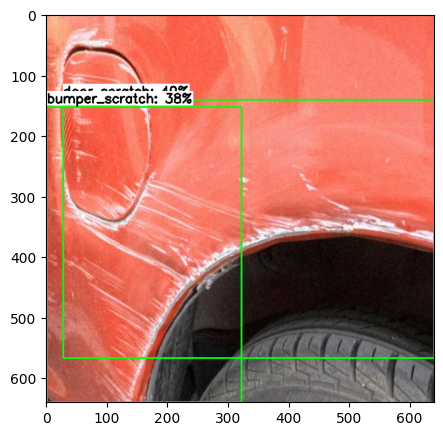

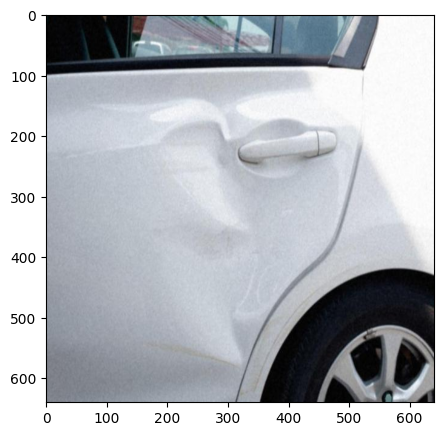

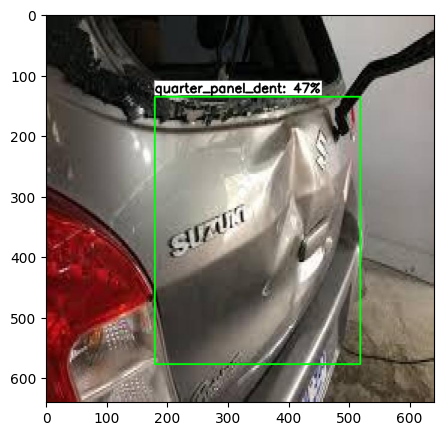

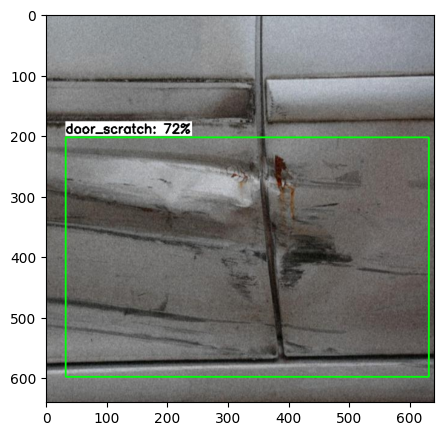

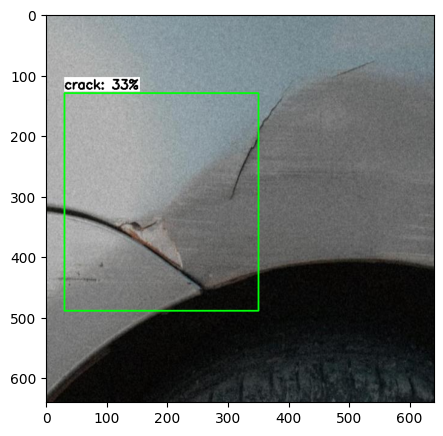

...

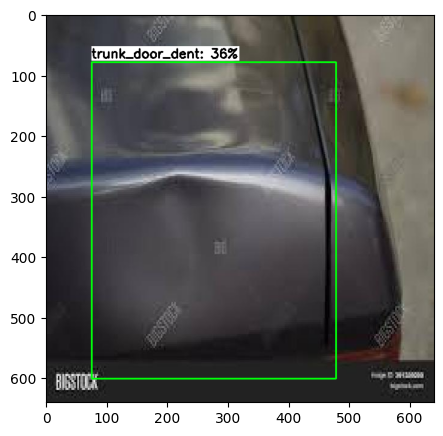

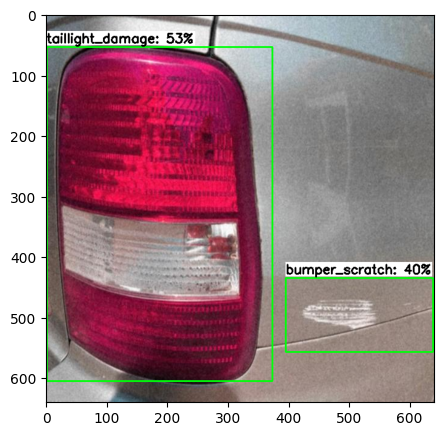

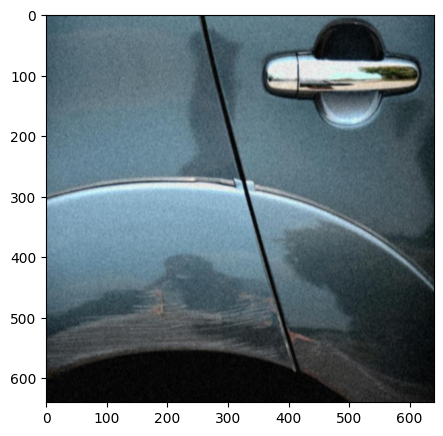

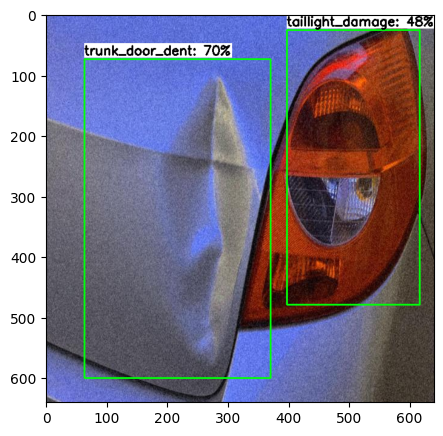

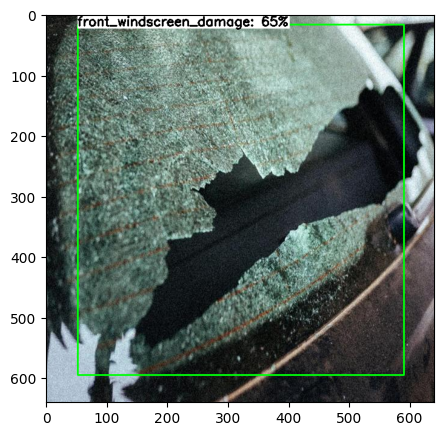

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/gdrive/MyDrive/image-testing-with-xml'  # Path to test images folder
PATH_TO_MODEL='/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite/detect.tflite' # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'  # Path to labelmap.txt file
min_conf_threshold=0.3   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 15  # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

## 4.2&nbsp;Calculate mAP

In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2024-06-02 16:38:48--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 56.4M=0s

2024-06-02 16:38:48 (56.4 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [ ]:
!cp /content/gdrive/MyDrive/image-testing-with-xml/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/gdrive/MyDrive/image-testing-with-xml'  # Path to test images folder
PATH_TO_MODEL='/content/gdrive/MyDrive/ssd_mobilenet_v2_fpnlite_640x640_4000steps/custom_model_tflite/detect.tflite' # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'  # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 15 images...
Finished inferencing!


In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt --outdir=/content/mAP/output2

/content/mAP
Calculating mAP at 0.50 IoU threshold...
100.00% = crack AP 
0.00% = door_dent AP 
66.67% = door_scratch AP 
100.00% = front_windscreen_damage AP 
0.00% = quarter_panel_scratch AP 
60.00% = trunk_door_dent AP 
mAP = 54.44%
Calculating mAP at 0.55 IoU threshold...
100.00% = crack AP 
0.00% = door_dent AP 
66.67% = door_scratch AP 
100.00% = front_windscreen_damage AP 
0.00% = quarter_panel_scratch AP 
26.67% = trunk_door_dent AP 
mAP = 48.89%
Calculating mAP at 0.60 IoU threshold...
100.00% = crack AP 
0.00% = door_dent AP 
66.67% = door_scratch AP 
100.00% = front_windscreen_damage AP 
0.00% = quarter_panel_scratch AP 
26.67% = trunk_door_dent AP 
mAP = 48.89%
Calculating mAP at 0.65 IoU threshold...
100.00% = crack AP 
0.00% = door_dent AP 
66.67% = door_scratch AP 
100.00% = front_windscreen_damage AP 
0.00% = quarter_panel_scratch AP 
26.67% = trunk_door_dent AP 
mAP = 48.89%
Calculating mAP at 0.70 IoU threshold...
100.00% = crack AP 
0.00% = door_dent AP 
66.67% = doo